In [2]:
# import numpy as np
# import librosa
# import os
# import pickle
# import soundfile as sf  
# from scipy import signal
# from cryptography.hazmat.primitives.asymmetric import rsa, padding
# from cryptography.hazmat.primitives import hashes
# from cryptography.hazmat.primitives.serialization import Encoding, PrivateFormat, PublicFormat, NoEncryption
# import hashlib

# class SpreadSpectrumWatermarker:
#     """Audio watermarking class implementing spread spectrum technique"""
    
#     def __init__(self, watermark_bits=32, alpha=0.1, chip_rate=4):
#         """
#         Initialize the watermarker
        
#         Args:
#             watermark_bits: Number of bits in the watermark
#             alpha: Strength of the watermark (lower = more imperceptible, higher = more robust)
#             chip_rate: Number of chips per bit (higher = more robust)
#         """
#         self.watermark_bits = watermark_bits
#         self.alpha = alpha
#         self.chip_rate = chip_rate
#         self.total_chips = watermark_bits * chip_rate
        
#         # Generate random watermark sequence
#         self.watermark = np.random.randint(0, 2, size=watermark_bits).astype(np.int8)
#         # print(f"Watermark: {self.watermark}")
        
#         # Generate pseudo-noise sequence for spreading
#         self.pn_sequence = np.random.randn(self.total_chips)
#         self.pn_sequence = self.pn_sequence / np.sqrt(np.sum(self.pn_sequence**2))  # Normalize
#         # print(f"PN Sequence: {self.pn_sequence}")
    
#     def embed(self, audio, sr=16000):
#         """Embed watermark into audio using spread spectrum technique"""
        
#         watermarked_audio = audio.copy()
        
        
#         if len(audio) < self.total_chips * 10:  
#             print("Warning: Audio too short for robust watermarking")
            
#             if len(audio) < self.total_chips:
#                 padding = np.zeros(self.total_chips - len(audio))
#                 watermarked_audio = np.concatenate([watermarked_audio, padding])
        
        
#         stft = librosa.stft(watermarked_audio)
#         magnitude, phase = librosa.magphase(stft)
#         # print(f"Fourier Transform {stft}" )
        
        
#         spread_watermark = np.zeros(self.total_chips)
        
#         # Spread each bit
#         for i in range(self.watermark_bits):
#             bit_value = 2 * self.watermark[i] - 1  
#             start_idx = i * self.chip_rate
#             end_idx = (i + 1) * self.chip_rate
#             spread_watermark[start_idx:end_idx] = bit_value * self.pn_sequence[start_idx:end_idx]
        
#         # Reshape watermark to fit in the magnitude spectrum (middle frequencies)
#         freq_bins = magnitude.shape[0]
#         time_frames = magnitude.shape[1]
        
#         # Select middle frequency bins for watermarking (avoid very low and very high frequencies)
#         start_bin = freq_bins // 4
#         end_bin = 3 * freq_bins // 4
#         bins_to_use = end_bin - start_bin
        
#         # Replicate watermark across time frames if needed
#         full_watermark = np.zeros((freq_bins, time_frames))
#         spread_watermark_resized = np.resize(spread_watermark, (bins_to_use, time_frames))
#         full_watermark[start_bin:end_bin, :] = spread_watermark_resized
        
#         # Apply watermark to magnitude spectrum
#         magnitude_watermarked = magnitude * (1 + self.alpha * full_watermark)
        
#         # Reconstruct STFT
#         stft_watermarked = magnitude_watermarked * phase
        
#         # Inverse STFT
#         watermarked_audio = librosa.istft(stft_watermarked, length=len(watermarked_audio))
        
#         return watermarked_audio
    
#     def detect(self, audio, sr=16000):
#         """Detect watermark in audio"""
#         # Apply STFT
#         stft = librosa.stft(audio)
#         magnitude, _ = librosa.magphase(stft)
        
#         # Extract the same frequency region used for embedding
#         freq_bins = magnitude.shape[0]
#         start_bin = freq_bins // 4
#         end_bin = 3 * freq_bins // 4
        
#         # Average across time frames to improve detection
#         magnitude_avg = np.mean(magnitude, axis=1)
        
#         # Correlate with PN sequence to extract bits
#         extracted_bits = np.zeros(self.watermark_bits, dtype=np.int8)
        
#         for i in range(self.watermark_bits):
#             start_idx = i * self.chip_rate
#             end_idx = (i + 1) * self.chip_rate
            
#             # Use corresponding frequency bins (scaled appropriately)
#             bin_start = start_bin + int(start_idx * (end_bin - start_bin) / self.total_chips)
#             bin_end = start_bin + int(end_idx * (end_bin - start_bin) / self.total_chips)
            
#             # Ensure valid range
#             bin_end = min(bin_end, end_bin)
            
#             if bin_end <= bin_start:
#                 bin_end = bin_start + 1
            
#             # Extract segment
#             segment = magnitude_avg[bin_start:bin_end]
            
#             # Correlate with PN sequence
#             pn_segment = self.pn_sequence[start_idx:end_idx]
#             pn_segment = np.resize(pn_segment, segment.shape)  # Ensure same size
            
#             correlation = np.sum(segment * pn_segment) / len(segment)
#             extracted_bits[i] = 1 if correlation > 0 else 0
        
#         # Calculate similarity (percentage match)
#         similarity = np.sum(extracted_bits == self.watermark) / self.watermark_bits
        
#         # Return True if similarity exceeds threshold (70%)
#         return similarity > 0.7, similarity
    
#     def get_watermark(self):
#         """Return the current watermark"""
#         return self.watermark
    
#     def set_watermark(self, watermark):
#         """Set a specific watermark"""
#         if len(watermark) == self.watermark_bits:
#             self.watermark = watermark
#         else:
#             raise ValueError(f"Watermark must be {self.watermark_bits} bits")


# class DigitalSignature:
#     """Class for digital signature operations"""
    
#     def __init__(self):
#         # Generate RSA key pair
#         self.private_key = rsa.generate_private_key(
#             public_exponent=65537,
#             key_size=2048
#         )
#         self.public_key = self.private_key.public_key()
    
#     def generate_hash(self, audio):
#         """Generate SHA-256 hash of audio data"""
#         # First normalize to [-1, 1] range
#         audio_norm = audio / (np.max(np.abs(audio)) + 1e-8)
#         # Convert to int16 for consistent hashing
#         audio_int = np.int16(audio_norm * 32767)
#         audio_bytes = audio_int.tobytes()
#         return hashlib.sha256(audio_bytes).digest()
    
#     def sign(self, audio):
#         """Sign audio with private key"""
#         audio_hash = self.generate_hash(audio)
#         signature = self.private_key.sign(
#             audio_hash,
#             padding.PSS(
#                 mgf=padding.MGF1(hashes.SHA256()),
#                 salt_length=padding.PSS.MAX_LENGTH
#             ),
#             hashes.SHA256()
#         )
#         return signature
    
#     def verify(self, audio, signature):
#         """Verify signature with public key"""
#         audio_hash = self.generate_hash(audio)
#         try:
#             self.public_key.verify(
#                 signature,
#                 audio_hash,
#                 padding.PSS(
#                     mgf=padding.MGF1(hashes.SHA256()),
#                     salt_length=padding.PSS.MAX_LENGTH
#                 ),
#                 hashes.SHA256()
#             )
#             return True
#         except Exception as e:
#             print(f"Signature verification failed: {e}")
#             return False
    
#     def export_keys(self):
#         """Export keys for later use"""
#         private_key_bytes = self.private_key.private_bytes(
#             encoding=Encoding.PEM,
#             format=PrivateFormat.PKCS8,
#             encryption_algorithm=NoEncryption()
#         )
#         public_key_bytes = self.public_key.public_bytes(
#             encoding=Encoding.PEM,
#             format=PublicFormat.SubjectPublicKeyInfo
#         )
#         return private_key_bytes, public_key_bytes


# class AudioPreprocessor:
#     """Main class for preprocessing audio with watermarking and digital signatures"""
    
#     def __init__(self, watermark_bits=64, alpha=0.05, chip_rate=8):
#         self.watermarker = SpreadSpectrumWatermarker(
#             watermark_bits=watermark_bits,
#             alpha=alpha,
#             chip_rate=chip_rate
#         )
#         self.digital_signature = DigitalSignature()
        
#         # Database to store watermarks and signatures
#         self.security_db = {}
    
#     def process_directory(self, input_dir, output_dir, sample_rate=16000):
#         """Process all audio files in a directory"""
#         # Create output directory if it doesn't exist
#         os.makedirs(output_dir, exist_ok=True)
        
#         # Process each audio file
#         processed_count = 0
#         for filename in os.listdir(input_dir):
#             if filename.endswith(('.wav', '.mp3', '.flac')):
#                 try:
#                     # Load audio file
#                     filepath = os.path.join(input_dir, filename)
#                     audio, sr = librosa.load(filepath, sr=sample_rate, mono=True)
                    
#                     # Process audio
#                     audio_id = os.path.splitext(filename)[0]
#                     processed_audio = self.process_audio(audio, audio_id)
                    
#                     output_path = os.path.join(output_dir, f"{audio_id}_processed.wav")
#                     sf.write(output_path, processed_audio, sample_rate)
                    
#                     processed_count += 1
#                     print(f"Processed {filename} -> {output_path}")
#                 except Exception as e:
#                     print(f"Error processing {filename}: {e}")
        
#         # Save security database
#         self.save_security_db(os.path.join(output_dir, "security_db.pkl"))
        
#         print(f"Processed {processed_count} files.")
#         return processed_count
    
#     def process_audio(self, audio, audio_id):
#         """Process a single audio file with watermarking and digital signature"""
#         # 1. Embed watermark
#         watermarked_audio = self.watermarker.embed(audio)
        
#         # 2. Generate digital signature
#         signature = self.digital_signature.sign(watermarked_audio)
        
#         # 3. Store security data
#         self.security_db[audio_id] = {
#             'watermark': self.watermarker.get_watermark().copy(),
#             'signature': signature
#         }
        
#         return watermarked_audio
    
#     def verify_audio(self, audio, audio_id):
#         """Verify audio using stored watermark and signature"""
#         if audio_id not in self.security_db:
#             print(f"Audio ID {audio_id} not found in security database")
#             return False
        
#         # 1. Check watermark
#         self.watermarker.set_watermark(self.security_db[audio_id]['watermark'])
#         watermark_valid, similarity = self.watermarker.detect(audio)
#         if not watermark_valid:
#             print(f"Watermark verification failed for {audio_id} (similarity: {similarity:.2f})")
#             return False
        
#         # 2. Check digital signature
#         signature_valid = self.digital_signature.verify(audio, self.security_db[audio_id]['signature'])
#         if not signature_valid:
#             print(f"Digital signature verification failed for {audio_id}")
#             return False
        
#         print(f"Audio {audio_id} verified successfully (watermark similarity: {similarity:.2f})")
#         return True
    
#     def save_security_db(self, filename):
#         """Save the security database"""
#         with open(filename, 'wb') as f:
#             pickle.dump({
#                 'security_db': self.security_db,
#                 'watermark_bits': self.watermarker.watermark_bits,
#                 'chip_rate': self.watermarker.chip_rate,
#                 'alpha': self.watermarker.alpha,
#                 'pn_sequence': self.watermarker.pn_sequence,
#                 'keys': self.digital_signature.export_keys()
#             }, f)
#         print(f"Security database saved to {filename}")
    
#     def load_security_db(self, filename):
#         """Load the security database"""
#         with open(filename, 'rb') as f:
#             data = pickle.load(f)
#             self.security_db = data['security_db']
#             self.watermarker.watermark_bits = data['watermark_bits']
#             self.watermarker.chip_rate = data['chip_rate']
#             self.watermarker.alpha = data['alpha']
#             self.watermarker.pn_sequence = data['pn_sequence']
            
#         print(f"Security database loaded from {filename}")



# if __name__ == "__main__":
    
#     input_dir = "./archive/dev/real/"  
#     output_dir = "./processed_audio/"  
    
    
#     preprocessor = AudioPreprocessor(
#         watermark_bits=64,  
#         alpha=0.05,        
#         chip_rate=8         
#     )
    
#     print(f"Processing files from {input_dir} to {output_dir}...")
    
    
#     preprocessor.process_directory(input_dir, output_dir)
    
#     # Test 
#     test_files = os.listdir(output_dir)
#     test_file = next((f for f in test_files if f.endswith("_processed.wav")), None)
    
#     if test_file:
#         test_path = os.path.join(output_dir, test_file)
#         test_audio, sr = librosa.load(test_path, sr=16000, mono=True)
#         audio_id = test_file.replace("_processed.wav", "")
#         preprocessor.verify_audio(test_audio, audio_id)

Processing files from ./archive/dev/real/ to ./processed_audio/...
Processed B_0000_5_A.wav -> ./processed_audio/B_0000_5_A_processed.wav
Processed B_0001_20_C.wav -> ./processed_audio/B_0001_20_C_processed.wav
Processed B_0002_10_A.wav -> ./processed_audio/B_0002_10_A_processed.wav
Processed B_0003_5_B.wav -> ./processed_audio/B_0003_5_B_processed.wav
Processed B_0004_10_A.wav -> ./processed_audio/B_0004_10_A_processed.wav
Processed B_0005_5_A.wav -> ./processed_audio/B_0005_5_A_processed.wav
Processed B_0006_05_A.wav -> ./processed_audio/B_0006_05_A_processed.wav
Processed B_0007_10_B.wav -> ./processed_audio/B_0007_10_B_processed.wav
Processed B_0008_20_C.wav -> ./processed_audio/B_0008_20_C_processed.wav
Processed B_0009_05_A.wav -> ./processed_audio/B_0009_05_A_processed.wav
Processed B_0010_0_D.wav -> ./processed_audio/B_0010_0_D_processed.wav
Processed B_0011_0_C.wav -> ./processed_audio/B_0011_0_C_processed.wav
Processed B_0012_0_D.wav -> ./processed_audio/B_0012_0_D_processed.

In [3]:
import numpy as np
import os
import pickle
import hashlib
import librosa
import soundfile as sf
from cryptography.hazmat.primitives import hashes
from cryptography.hazmat.primitives.asymmetric import rsa, padding
from cryptography.hazmat.primitives.serialization import (
    Encoding, PrivateFormat, PublicFormat, NoEncryption
)
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import joblib

class SpreadSpectrumWatermarker:
    """Audio watermarking class implementing spread spectrum technique"""
    
    def __init__(self, watermark_bits=32, alpha=0.1, chip_rate=4):
        """
        Initialize the watermarker
        
        Args:
            watermark_bits: Number of bits in the watermark
            alpha: Strength of the watermark (lower = more imperceptible, higher = more robust)
            chip_rate: Number of chips per bit (higher = more robust)
        """
        self.watermark_bits = watermark_bits
        self.alpha = alpha
        self.chip_rate = chip_rate
        self.total_chips = watermark_bits * chip_rate
        
        # Generate random watermark sequence
        self.watermark = np.random.randint(0, 2, size=watermark_bits).astype(np.int8)
        # print(f"Watermark: {self.watermark}")
        
        # Generate pseudo-noise sequence for spreading
        self.pn_sequence = np.random.randn(self.total_chips)
        self.pn_sequence = self.pn_sequence / np.sqrt(np.sum(self.pn_sequence**2))  # Normalize
        # print(f"PN Sequence: {self.pn_sequence}")
    
    def embed(self, audio, sr=16000):
        """Embed watermark into audio using spread spectrum technique"""
        
        watermarked_audio = audio.copy()
        
        
        if len(audio) < self.total_chips * 10:  
            print("Warning: Audio too short for robust watermarking")
            
            if len(audio) < self.total_chips:
                padding = np.zeros(self.total_chips - len(audio))
                watermarked_audio = np.concatenate([watermarked_audio, padding])
        
        
        stft = librosa.stft(watermarked_audio)
        magnitude, phase = librosa.magphase(stft)
        # print(f"Fourier Transform {stft}" )
        
        
        spread_watermark = np.zeros(self.total_chips)
        
        # Spread each bit
        for i in range(self.watermark_bits):
            bit_value = 2 * self.watermark[i] - 1  
            start_idx = i * self.chip_rate
            end_idx = (i + 1) * self.chip_rate
            spread_watermark[start_idx:end_idx] = bit_value * self.pn_sequence[start_idx:end_idx]
        
        # Reshape watermark to fit in the magnitude spectrum (middle frequencies)
        freq_bins = magnitude.shape[0]
        time_frames = magnitude.shape[1]
        
        # Select middle frequency bins for watermarking (avoid very low and very high frequencies)
        start_bin = freq_bins // 4
        end_bin = 3 * freq_bins // 4
        bins_to_use = end_bin - start_bin
        
        # Replicate watermark across time frames if needed
        full_watermark = np.zeros((freq_bins, time_frames))
        spread_watermark_resized = np.resize(spread_watermark, (bins_to_use, time_frames))
        full_watermark[start_bin:end_bin, :] = spread_watermark_resized
        
        # Apply watermark to magnitude spectrum
        magnitude_watermarked = magnitude * (1 + self.alpha * full_watermark)
        
        # Reconstruct STFT
        stft_watermarked = magnitude_watermarked * phase
        
        # Inverse STFT
        watermarked_audio = librosa.istft(stft_watermarked, length=len(watermarked_audio))
        
        return watermarked_audio
    
    def detect(self, audio, sr=16000):
        """Detect watermark in audio"""
        # Apply STFT
        stft = librosa.stft(audio)
        magnitude, _ = librosa.magphase(stft)
        
        # Extract the same frequency region used for embedding
        freq_bins = magnitude.shape[0]
        start_bin = freq_bins // 4
        end_bin = 3 * freq_bins // 4
        
        # Average across time frames to improve detection
        magnitude_avg = np.mean(magnitude, axis=1)
        
        # Correlate with PN sequence to extract bits
        extracted_bits = np.zeros(self.watermark_bits, dtype=np.int8)
        
        for i in range(self.watermark_bits):
            start_idx = i * self.chip_rate
            end_idx = (i + 1) * self.chip_rate
            
            # Use corresponding frequency bins (scaled appropriately)
            bin_start = start_bin + int(start_idx * (end_bin - start_bin) / self.total_chips)
            bin_end = start_bin + int(end_idx * (end_bin - start_bin) / self.total_chips)
            
            # Ensure valid range
            bin_end = min(bin_end, end_bin)
            
            if bin_end <= bin_start:
                bin_end = bin_start + 1
            
            # Extract segment
            segment = magnitude_avg[bin_start:bin_end]
            
            # Correlate with PN sequence
            pn_segment = self.pn_sequence[start_idx:end_idx]
            pn_segment = np.resize(pn_segment, segment.shape)  # Ensure same size
            
            correlation = np.sum(segment * pn_segment) / len(segment)
            extracted_bits[i] = 1 if correlation > 0 else 0
        
        # Calculate similarity (percentage match)
        similarity = np.sum(extracted_bits == self.watermark) / self.watermark_bits
        
        # Return True if similarity exceeds threshold (70%)
        return similarity > 0.7, similarity
    
    def get_watermark(self):
        """Return the current watermark"""
        return self.watermark
    
    def set_watermark(self, watermark):
        """Set a specific watermark"""
        if len(watermark) == self.watermark_bits:
            self.watermark = watermark
        else:
            raise ValueError(f"Watermark must be {self.watermark_bits} bits")


class DigitalSignature:
    """Class for digital signature operations"""
    
    def __init__(self):
        # Generate RSA key pair
        self.private_key = rsa.generate_private_key(
            public_exponent=65537,
            key_size=2048
        )
        self.public_key = self.private_key.public_key()
    
    def generate_hash(self, audio):
        """Generate SHA-256 hash of audio data"""
        # First normalize to [-1, 1] range
        audio_norm = audio / (np.max(np.abs(audio)) + 1e-8)
        # Convert to int16 for consistent hashing
        audio_int = np.int16(audio_norm * 32767)
        audio_bytes = audio_int.tobytes()
        return hashlib.sha256(audio_bytes).digest()
    
    def sign(self, audio):
        """Sign audio with private key"""
        audio_hash = self.generate_hash(audio)
        signature = self.private_key.sign(
            audio_hash,
            padding.PSS(
                mgf=padding.MGF1(hashes.SHA256()),
                salt_length=padding.PSS.MAX_LENGTH
            ),
            hashes.SHA256()
        )
        return signature
    
    def verify(self, audio, signature):
        """Verify signature with public key"""
        audio_hash = self.generate_hash(audio)
        try:
            self.public_key.verify(
                signature,
                audio_hash,
                padding.PSS(
                    mgf=padding.MGF1(hashes.SHA256()),
                    salt_length=padding.PSS.MAX_LENGTH
                ),
                hashes.SHA256()
            )
            return True
        except Exception as e:
            print(f"Signature verification failed: {e}")
            return False
    
    def export_keys(self):
        """Export keys for later use"""
        private_key_bytes = self.private_key.private_bytes(
            encoding=Encoding.PEM,
            format=PrivateFormat.PKCS8,
            encryption_algorithm=NoEncryption()
        )
        public_key_bytes = self.public_key.public_bytes(
            encoding=Encoding.PEM,
            format=PublicFormat.SubjectPublicKeyInfo
        )
        return private_key_bytes, public_key_bytes


class FeatureExtractor:
    """Class for extracting features from audio for spoofing detection"""
    
    def __init__(self, n_mfcc=20, n_gtcc=20, n_mels=128, hop_length=512):
        self.n_mfcc = n_mfcc
        self.n_gtcc = n_gtcc
        self.n_mels = n_mels
        self.hop_length = hop_length
    
    def extract_mfcc(self, audio, sr=16000):
        """Extract Mel Frequency Cepstral Coefficients"""
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=self.n_mfcc, hop_length=self.hop_length)
        # Compute statistics over time
        mfcc_mean = np.mean(mfccs, axis=1)
        mfcc_std = np.std(mfccs, axis=1)
        mfcc_delta = librosa.feature.delta(mfccs)
        mfcc_delta_mean = np.mean(mfcc_delta, axis=1)
        mfcc_delta_std = np.std(mfcc_delta, axis=1)
        
        return np.concatenate([mfcc_mean, mfcc_std, mfcc_delta_mean, mfcc_delta_std])
    
    def extract_gtcc(self, audio, sr=16000):
        """Extract Gammatone Cepstral Coefficients"""
        # Using librosa's mel spectrogram as an approximation for GTCC
        # A proper GTCC implementation would use a gammatone filterbank
        mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=self.n_gtcc, hop_length=self.hop_length)
        log_mel = librosa.power_to_db(mel_spec)
        gtccs = librosa.feature.mfcc(S=log_mel, n_mfcc=self.n_gtcc)
        
        # Compute statistics
        gtcc_mean = np.mean(gtccs, axis=1)
        gtcc_std = np.std(gtccs, axis=1)
        gtcc_delta = librosa.feature.delta(gtccs)
        gtcc_delta_mean = np.mean(gtcc_delta, axis=1)
        gtcc_delta_std = np.std(gtcc_delta, axis=1)
        
        return np.concatenate([gtcc_mean, gtcc_std, gtcc_delta_mean, gtcc_delta_std])
    
    def extract_spectrogram_features(self, audio, sr=16000):
        """Extract features from spectrogram"""
        # Compute spectrogram
        spec = np.abs(librosa.stft(audio, hop_length=self.hop_length))
        
        # Extract spectral statistics
        spec_centroid = librosa.feature.spectral_centroid(S=spec)[0]
        spec_bandwidth = librosa.feature.spectral_bandwidth(S=spec)[0]
        spec_rolloff = librosa.feature.spectral_rolloff(S=spec)[0]
        spec_contrast = librosa.feature.spectral_contrast(S=spec)[0]
        
        # Handle potential empty arrays
        mean_contrast = np.mean(spec_contrast) if spec_contrast.size > 0 else 0
        std_contrast = np.std(spec_contrast) if spec_contrast.size > 0 else 0
        
        # Compute statistics
        features = np.concatenate([
            [np.mean(spec_centroid), np.std(spec_centroid)],
            [np.mean(spec_bandwidth), np.std(spec_bandwidth)],
            [np.mean(spec_rolloff), np.std(spec_rolloff)],
            [mean_contrast, std_contrast]  # Now properly wrapped
        ])
        
        return features
    
    def extract_all_features(self, audio, sr=16000):
        """Extract all features from audio"""
        try:
            # Make sure audio isn't too short
            if len(audio) < sr:  # Less than 1 second
                padding = np.zeros(sr - len(audio))
                audio = np.concatenate([audio, padding])
            
            # Extract features
            mfcc_features = self.extract_mfcc(audio, sr)
            gtcc_features = self.extract_gtcc(audio, sr)
            spec_features = self.extract_spectrogram_features(audio, sr)
            
            # Combine all features
            all_features = np.concatenate([mfcc_features, gtcc_features, spec_features])
            
            return all_features
        except Exception as e:
            print(f"Error in feature extraction: {e}")
            # Return a feature vector of zeros with the expected length
            expected_length = self.n_mfcc * 4 + self.n_gtcc * 4 + 10  # Approximate expected length
            return np.zeros(expected_length)


class SpoofingDetectionModel:
    """Machine learning model for spoofing detection"""
    
    def __init__(self, model_type='rf'):
        self.model_type = model_type
        if model_type == 'rf':
            self.model = RandomForestClassifier(n_estimators=100, random_state=42)
        elif model_type == 'svm':
            self.model = SVC(probability=True, random_state=42)
        else:
            raise ValueError(f"Unsupported model type: {model_type}")
        
        self.scaler = StandardScaler()
    
    def train(self, X, y):
        """Train the model on extracted features"""
        # Scale features
        X_scaled = self.scaler.fit_transform(X)
        
        # Split data into training and validation sets
        X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
        
        # Train model
        self.model.fit(X_train, y_train)
        
        # Evaluate model
        val_acc = self.model.score(X_val, y_val)
        y_pred = self.model.predict(X_val)
        report = classification_report(y_val, y_pred, output_dict=True)
        
        print(f"Validation accuracy: {val_acc:.4f}")
        print(f"Real audio F1-score: {report['1']['f1-score']:.4f}")
        print(f"Spoofed audio F1-score: {report['0']['f1-score']:.4f}")
        
        return val_acc
    
    def predict(self, X):
        """Predict if audio is real or spoofed"""
        # Scale features
        X_scaled = self.scaler.transform(X.reshape(1, -1))
        
        # Predict
        prediction = self.model.predict(X_scaled)
        probability = self.model.predict_proba(X_scaled)[0]
        
        return bool(prediction[0]), probability
    
    def save(self, path):
        """Save model to file"""
        joblib.dump((self.model, self.scaler), path)
        print(f"Model saved to {path}")
    
    def load(self, path):
        """Load model from file"""
        self.model, self.scaler = joblib.load(path)
        print(f"Model loaded from {path}")


class AudioPreprocessor:
    """Main class for preprocessing audio with watermarking and digital signatures"""
    
    def __init__(self, watermark_bits=64, alpha=0.05, chip_rate=8):
        self.watermarker = SpreadSpectrumWatermarker(
            watermark_bits=watermark_bits,
            alpha=alpha,
            chip_rate=chip_rate
        )
        self.digital_signature = DigitalSignature()
        
        # Database to store watermarks and signatures
        self.security_db = {}
    
    def process_directory(self, input_dir, output_dir, sample_rate=16000):
        """Process all audio files in a directory"""
        # Create output directory if it doesn't exist
        os.makedirs(output_dir, exist_ok=True)
        
        # Process each audio file
        processed_count = 0
        for filename in os.listdir(input_dir):
            if filename.endswith(('.wav', '.mp3', '.flac')):
                try:
                    # Load audio file
                    filepath = os.path.join(input_dir, filename)
                    audio, sr = librosa.load(filepath, sr=sample_rate, mono=True)
                    
                    # Process audio
                    audio_id = os.path.splitext(filename)[0]
                    processed_audio = self.process_audio(audio, audio_id)
                    
                    output_path = os.path.join(output_dir, f"{audio_id}_processed.wav")
                    sf.write(output_path, processed_audio, sample_rate)
                    
                    processed_count += 1
                    print(f"Processed {filename} -> {output_path}")
                except Exception as e:
                    print(f"Error processing {filename}: {e}")
        
        # Save security database
        self.save_security_db(os.path.join(output_dir, "security_db.pkl"))
        
        print(f"Processed {processed_count} files.")
        return processed_count
    
    def process_audio(self, audio, audio_id):
        """Process a single audio file with watermarking and digital signature"""
        # 1. Embed watermark
        watermarked_audio = self.watermarker.embed(audio)
        
        # 2. Generate digital signature
        signature = self.digital_signature.sign(watermarked_audio)
        
        # 3. Store security data
        self.security_db[audio_id] = {
            'watermark': self.watermarker.get_watermark().copy(),
            'signature': signature
        }
        
        return watermarked_audio
    
    def verify_audio(self, audio, audio_id):
        """Verify audio using stored watermark and signature"""
        if audio_id not in self.security_db:
            print(f"Audio ID {audio_id} not found in security database")
            return False
        
        # 1. Check watermark
        self.watermarker.set_watermark(self.security_db[audio_id]['watermark'])
        watermark_valid, similarity = self.watermarker.detect(audio)
        if not watermark_valid:
            print(f"Watermark verification failed for {audio_id} (similarity: {similarity:.2f})")
            return False
        
        # 2. Check digital signature
        signature_valid = self.digital_signature.verify(audio, self.security_db[audio_id]['signature'])
        if not signature_valid:
            print(f"Digital signature verification failed for {audio_id}")
            return False
        
        print(f"Audio {audio_id} verified successfully (watermark similarity: {similarity:.2f})")
        return True
    
    def save_security_db(self, filename):
        """Save the security database"""
        with open(filename, 'wb') as f:
            pickle.dump({
                'security_db': self.security_db,
                'watermark_bits': self.watermarker.watermark_bits,
                'chip_rate': self.watermarker.chip_rate,
                'alpha': self.watermarker.alpha,
                'pn_sequence': self.watermarker.pn_sequence,
                'keys': self.digital_signature.export_keys()
            }, f)
        print(f"Security database saved to {filename}")
    
    def load_security_db(self, filename):
        """Load the security database"""
        with open(filename, 'rb') as f:
            data = pickle.load(f)
            self.security_db = data['security_db']
            self.watermarker.watermark_bits = data['watermark_bits']
            self.watermarker.chip_rate = data['chip_rate']
            self.watermarker.alpha = data['alpha']
            self.watermarker.pn_sequence = data['pn_sequence']
            
        print(f"Security database loaded from {filename}")


class AudioSpoofingDetectionSystem:
    """Complete audio spoofing detection system that combines watermarking, 
    digital signatures, and ML-based detection"""
    
    def __init__(self, watermark_bits=64, alpha=0.05, chip_rate=8, model_type='rf'):
        # Initialize components
        self.preprocessor = AudioPreprocessor(
            watermark_bits=watermark_bits, 
            alpha=alpha, 
            chip_rate=chip_rate
        )
        self.feature_extractor = FeatureExtractor()
        self.ml_model = SpoofingDetectionModel(model_type=model_type)
        
        # Status flags
        self.is_trained = False
    
    def train(self, bonafide_dir, spoofed_dir, sample_rate=16000):
        """Train the complete system"""
        print("=== Starting Training Phase ===")
        print("1. Processing bonafide audio files (watermarking + signatures)...")
        
        # Create a directory for processed bonafide audio
        processed_dir = os.path.join(os.path.dirname(bonafide_dir), "processed_bonafide")
        self.preprocessor.process_directory(bonafide_dir, processed_dir, sample_rate)
        
        print("\n2. Extracting features for ML model...")
        
        # Prepare feature data and labels
        features = []
        labels = []
        
        # Process bonafide audio (labeled as 1)
        print("  Extracting features from bonafide audio...")
        for filename in os.listdir(processed_dir):
            if filename.endswith('.wav'):
                try:
                    filepath = os.path.join(processed_dir, filename)
                    audio, sr = librosa.load(filepath, sr=sample_rate, mono=True)
                    
                    # Extract features
                    audio_features = self.feature_extractor.extract_all_features(audio, sr)
                    features.append(audio_features)
                    labels.append(1)  # 1 = real
                except Exception as e:
                    print(f"Error extracting features from {filename}: {e}")
        
        # Process spoofed audio (labeled as 0)
        print("  Extracting features from spoofed audio...")
        for filename in os.listdir(spoofed_dir):
            if filename.endswith(('.wav', '.mp3', '.flac')):
                try:
                    filepath = os.path.join(spoofed_dir, filename)
                    audio, sr = librosa.load(filepath, sr=sample_rate, mono=True)
                    
                    # Extract features
                    audio_features = self.feature_extractor.extract_all_features(audio, sr)
                    features.append(audio_features)
                    labels.append(0)  # 0 = spoofed
                except Exception as e:
                    print(f"Error extracting features from {filename}: {e}")
        
        # Convert to numpy arrays
        X = np.array(features)
        y = np.array(labels)
        
        # Train ML model
        print("\n3. Training ML model...")
        validation_accuracy = self.ml_model.train(X, y)
        
        # Save model
        models_dir = os.path.join(os.path.dirname(bonafide_dir), "models")
        os.makedirs(models_dir, exist_ok=True)
        self.ml_model.save(os.path.join(models_dir, "spoofing_detection_model.pkl"))
        
        self.is_trained = True
        print(f"\n=== Training Complete (Validation Accuracy: {validation_accuracy:.4f}) ===")
        
        return validation_accuracy
    
    def detect_spoofing(self, audio_path, audio_id=None, sample_rate=16000):
        """Detect if an audio file is spoofed using the full pipeline"""
        if not self.is_trained and not os.path.exists("models/spoofing_detection_model.pkl"):
            print("Error: System not trained. Please train the system first.")
            return False, 0.0
        
        print("=== Starting Detection ===")
        
        # Load audio
        audio, sr = librosa.load(audio_path, sr=sample_rate, mono=True)
        
        # If no audio_id provided, use filename
        if audio_id is None:
            audio_id = os.path.splitext(os.path.basename(audio_path))[0]
        
        # Step 1: Verify watermark and signature (if available)
        security_passed = True
        if audio_id in self.preprocessor.security_db:
            print("1. Verifying security features...")
            security_passed = self.preprocessor.verify_audio(audio, audio_id)
            
            if not security_passed:
                print("Security verification failed - Audio classified as SPOOFED")
                return False, 1.0 
        else:
            print("No security data available for this audio - Proceeding to ML detection")
        
        # Step 2: Extract features
        print("2. Extracting audio features...")
        features = self.feature_extractor.extract_all_features(audio, sr)
        
        # Step 3: Run ML classification
        print("3. Running ML classification...")
        if not self.is_trained:
            self.ml_model.load("models/spoofing_detection_model.pkl")
            self.is_trained = True
            
        is_real, probabilities = self.ml_model.predict(features)
        
        # Step 4: Final decision
        spoofed_probability = probabilities[0] if not is_real else 1.0 - probabilities[1]
        
        # If security checks failed, override ML decision
        if not security_passed:
            is_real = False
            spoofed_probability = 1.0
            
        result = "REAL" if is_real else "SPOOFED"
        confidence = (1.0 - spoofed_probability) if is_real else spoofed_probability
        
        print(f"=== Detection Result: {result} (Confidence: {confidence:.4f}) ===")
        
        return is_real, confidence
    
    def load_system(self, security_db_path, model_path):
        """Load a previously trained system"""
        # Load security database
        self.preprocessor.load_security_db(security_db_path)
        
        # Load ML model
        self.ml_model.load(model_path)
        self.is_trained = True
        
        print("System loaded successfully")
        
    def save_system(self, output_dir):
        """Save the complete system"""
        os.makedirs(output_dir, exist_ok=True)
        
        # Save security database
        security_db_path = os.path.join(output_dir, "security_db.pkl")
        self.preprocessor.save_security_db(security_db_path)
        
        # Save ML model
        model_path = os.path.join(output_dir, "spoofing_detection_model.pkl")
        self.ml_model.save(model_path)
        
        print(f"System saved to {output_dir}")


# Example usage
if __name__ == "__main__":
    # Initialize the system
    system = AudioSpoofingDetectionSystem(
        watermark_bits=64,
        alpha=0.05,
        chip_rate=8,
        model_type='rf'
    )
    
    # Define dataset directories
    # dataset_root = "path/to/scene_fake_dataset"
    # train_dir = os.path.join(dataset_root, "train")
    # test_dir = os.path.join(dataset_root, "test")
    
   
    train_real_dir = "./archive/train/real/"
    train_fake_dir = "./archive/train/fake/"
    
    # Training phase
    system.train(
        bonafide_dir=train_real_dir,
        spoofed_dir=train_fake_dir,
        sample_rate=16000
    )
    
    # Save the trained system
    system.save_system("trained_system")
    
    # Process evaluation real files with watermarks
    print("\n=== Processing Evaluation Real Files with Watermarks ===")
    eval_real_processed_dir = "./archive/eval/real_processed"
    os.makedirs(eval_real_processed_dir, exist_ok=True)
    system.preprocessor.process_directory(
        input_dir="./archive/eval/real",
        output_dir=eval_real_processed_dir,
        sample_rate=16000
    )
    
    # Testing phase - process all files in test directory
    test_results = []
    
    # Test real samples (using processed files)
    print("\n=== Testing Real Audio Samples ===")
    test_real_dir = eval_real_processed_dir  
    for filename in os.listdir(test_real_dir):
        if filename.endswith(('.wav', '.mp3', '.flac')):
            audio_path = os.path.join(test_real_dir, filename)
            is_real, confidence = system.detect_spoofing(
                audio_path=audio_path,
                sample_rate=16000
            )
            test_results.append({
                'file': filename,
                'actual': 'REAL',
                'predicted': 'REAL' if is_real else 'SPOOFED',
                'confidence': confidence
            })
            print(f"{filename} is {'REAL' if is_real else 'SPOOFED'} with {confidence*100:.2f}% confidence")
    
    # Test fake samples
    print("\n=== Testing Fake Audio Samples ===")
    test_fake_dir = "./archive/eval/fake/"
    for filename in os.listdir(test_fake_dir):
        if filename.endswith(('.wav', '.mp3', '.flac')):
            audio_path = os.path.join(test_fake_dir, filename)
            is_real, confidence = system.detect_spoofing(
                audio_path=audio_path,
                sample_rate=16000
            )
            test_results.append({
                'file': filename,
                'actual': 'FAKE',
                'predicted': 'REAL' if is_real else 'SPOOFED',
                'confidence': confidence
            })
            print(f"{filename} is {'REAL' if is_real else 'SPOOFED'} with {confidence*100:.2f}% confidence")
    
    # Calculate overall accuracy
    correct = sum(1 for result in test_results if 
                  (result['actual'] == 'REAL' and result['predicted'] == 'REAL') or
                  (result['actual'] == 'FAKE' and result['predicted'] == 'SPOOFED'))
    accuracy = correct / len(test_results) if test_results else 0
    
    print(f"\nOverall Testing Accuracy: {accuracy*100:.2f}%")
    
    # Save results to CSV
    import csv
    with open('test_results.csv', 'w', newline='') as csvfile:
        fieldnames = ['file', 'actual', 'predicted', 'confidence']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
        for result in test_results:
            writer.writerow(result)

=== Starting Training Phase ===
1. Processing bonafide audio files (watermarking + signatures)...
Processed A_000_0_A.wav -> ./archive/train/real\processed_bonafide\A_000_0_A_processed.wav
Processed A_001_0_A.wav -> ./archive/train/real\processed_bonafide\A_001_0_A_processed.wav
Processed A_002_0_B.wav -> ./archive/train/real\processed_bonafide\A_002_0_B_processed.wav
Processed A_003_0_B.wav -> ./archive/train/real\processed_bonafide\A_003_0_B_processed.wav
Processed A_004_0_C.wav -> ./archive/train/real\processed_bonafide\A_004_0_C_processed.wav
Processed A_005_0_B.wav -> ./archive/train/real\processed_bonafide\A_005_0_B_processed.wav
Processed A_006_0_B.wav -> ./archive/train/real\processed_bonafide\A_006_0_B_processed.wav
Processed A_007_0_C.wav -> ./archive/train/real\processed_bonafide\A_007_0_C_processed.wav
Processed A_008_0_B.wav -> ./archive/train/real\processed_bonafide\A_008_0_B_processed.wav
Processed A_009_0_A.wav -> ./archive/train/real\processed_bonafide\A_009_0_A_proces

In [4]:
def compare_watermarked_audio(original_audio_path, watermarked_audio_path, output_image_path=None):
    """
    Compare original and watermarked audio files with spectrograms and waveforms
    
    Args:
        original_audio_path: Path to the original audio file
        watermarked_audio_path: Path to the watermarked audio file
        output_image_path: Optional path to save the comparison image
    """
    import matplotlib.pyplot as plt
    import librosa
    import librosa.display
    import numpy as np
    from scipy.spatial.distance import euclidean
    
    # Load the audio files
    y_orig, sr_orig = librosa.load(original_audio_path, sr=None)
    y_wm, sr_wm = librosa.load(watermarked_audio_path, sr=None)
    
 
    if sr_orig != sr_wm:
        print(f"Warning: Sample rates differ - Original: {sr_orig}Hz, Watermarked: {sr_wm}Hz")
        # Resample to the higher sample rate
        sr = max(sr_orig, sr_wm)
        if sr_orig != sr:
            y_orig = librosa.resample(y_orig, orig_sr=sr_orig, target_sr=sr)
        if sr_wm != sr:
            y_wm = librosa.resample(y_wm, orig_sr=sr_wm, target_sr=sr)
    else:
        sr = sr_orig
    
    
    min_length = min(len(y_orig), len(y_wm))
    y_orig = y_orig[:min_length]
    y_wm = y_wm[:min_length]
    
    # Compute spectrograms
    D_orig = librosa.stft(y_orig)
    D_wm = librosa.stft(y_wm)
    
    S_orig_db = librosa.amplitude_to_db(np.abs(D_orig), ref=np.max)
    S_wm_db = librosa.amplitude_to_db(np.abs(D_wm), ref=np.max)
    
    # Compute the difference between spectrograms
    diff_spec = S_wm_db - S_orig_db
    
    # Compute difference in waveform
    diff_waveform = y_wm - y_orig
    
    # Calculate some metrics
    snr = 10 * np.log10(np.sum(y_orig**2) / np.sum(diff_waveform**2))
    rmse = np.sqrt(np.mean((y_wm - y_orig)**2))
    max_diff = np.max(np.abs(y_wm - y_orig))
    
    # Compute correlation
    correlation = np.corrcoef(y_orig, y_wm)[0, 1]
    
    # Create plot
    plt.figure(figsize=(15, 12))
    
    # Original waveform
    plt.subplot(5, 1, 1)
    plt.title("Original Audio Waveform")
    librosa.display.waveshow(y_orig, sr=sr, alpha=0.8)
    plt.ylabel("Amplitude")
    
    # Watermarked waveform
    plt.subplot(5, 1, 2)
    plt.title("Watermarked Audio Waveform")
    librosa.display.waveshow(y_wm, sr=sr, alpha=0.8)
    plt.ylabel("Amplitude")
    
    # Difference in waveform (amplified for visibility)
    plt.subplot(5, 1, 3)
    plt.title("Difference in Waveform (amplified x10)")
    librosa.display.waveshow(diff_waveform * 10, sr=sr, alpha=0.8)
    plt.ylabel("Amplitude")
    
    # Spectrograms side by side with difference
    plt.subplot(5, 2, 7)
    plt.title("Original Spectrogram")
    librosa.display.specshow(S_orig_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(5, 2, 8)
    plt.title("Watermarked Spectrogram")
    librosa.display.specshow(S_wm_db, x_axis='time', y_axis='hz', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(5, 1, 5)
    plt.title("Difference in Spectrogram (Watermarked - Original)")
    img = librosa.display.specshow(diff_spec, x_axis='time', y_axis='hz', sr=sr, cmap='coolwarm')
    plt.colorbar(img, format='%+2.0f dB')
    
    # Add metrics as text
    plt.figtext(0.5, 0.01, 
                f"Signal-to-Noise Ratio: {snr:.2f} dB | RMSE: {rmse:.6f} | "
                f"Max Difference: {max_diff:.6f} | Correlation: {correlation:.6f}",
                ha="center", fontsize=12, bbox={"facecolor":"white", "alpha":0.8, "pad":5})
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    
    # Save figure if path provided
    if output_image_path:
        plt.savefig(output_image_path, dpi=300, bbox_inches='tight')
        print(f"Comparison saved to {output_image_path}")
    
    plt.show()
    
    # Print metrics
    print("\nAudio Comparison Metrics:")
    print(f"Signal-to-Noise Ratio (SNR): {snr:.2f} dB")
    print(f"Root Mean Square Error (RMSE): {rmse:.6f}")
    print(f"Maximum Absolute Difference: {max_diff:.6f}")
    print(f"Correlation Coefficient: {correlation:.6f}")
    
    # Return the metrics
    return {
        'snr': snr,
        'rmse': rmse,
        'max_diff': max_diff,
        'correlation': correlation
    }

Comparison saved to watermark_comparison.png


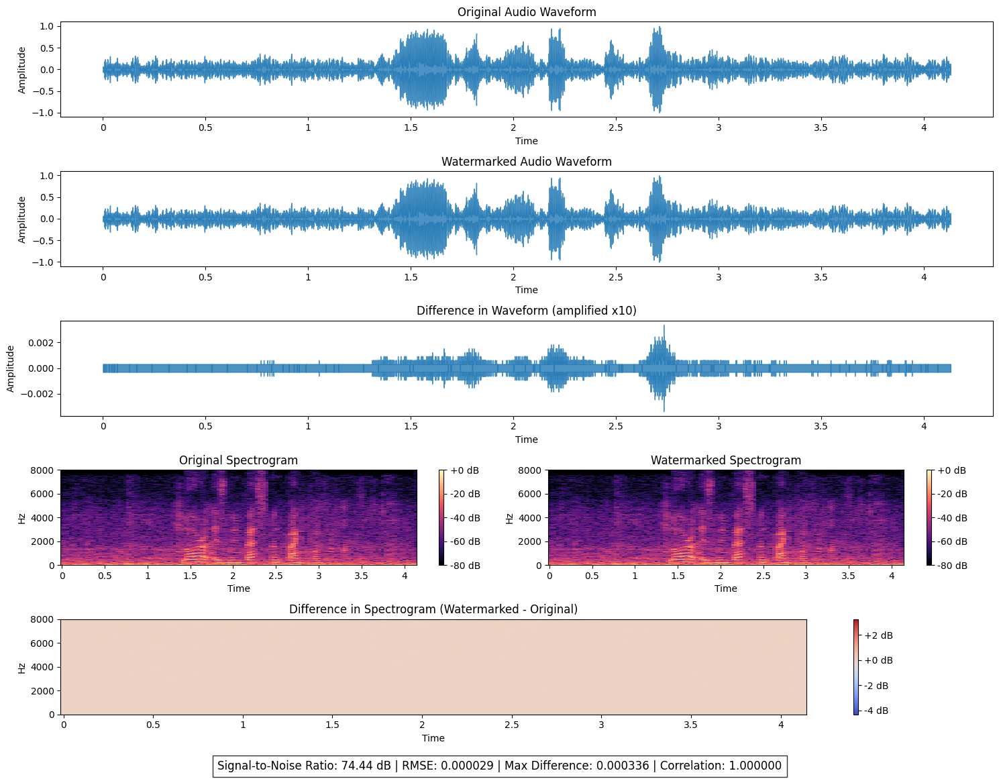


Audio Comparison Metrics:
Signal-to-Noise Ratio (SNR): 74.44 dB
Root Mean Square Error (RMSE): 0.000029
Maximum Absolute Difference: 0.000336
Correlation Coefficient: 1.000000


{'snr': 74.44164276123047,
 'rmse': 2.9163119e-05,
 'max_diff': 0.00033569336,
 'correlation': 0.9999999869162377}

In [5]:

original_file = "./archive/train/real/A_000_0_A.wav"
watermarked_file = "./archive/train/real/processed_bonafide/A_000_0_A_processed.wav"

# Process a file with the watermarker
audio, sr = librosa.load(original_file, sr=16000, mono=True)
watermarker = SpreadSpectrumWatermarker(watermark_bits=64, alpha=0.05, chip_rate=8)
watermarked_audio = watermarker.embed(audio)
sf.write(watermarked_file, watermarked_audio, sr)

# Compare the files
compare_watermarked_audio(original_file, watermarked_file, "watermark_comparison.png")

In [16]:
import pandas as pd
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, 
    mean_squared_error, mean_absolute_error
)

# Load dataset
file_path = "output.xlsx" 
df = pd.read_excel(file_path)

# Standardize labels: Convert "FAKE" to "SPOOFED"
df["actual"] = df["actual"].replace("FAKE", "SPOOFED")
df["predicted"] = df["predicted"].replace("FAKE", "SPOOFED")

# Extract actual and predicted labels
actual = df["actual"].tolist()
predicted = df["predicted"].tolist()

# Convert labels to numeric (REAL = 1, SPOOFED = 0)
actual_numeric = [1 if label == "REAL" else 0 for label in actual]
predicted_numeric = [1 if label == "REAL" else 0 for label in predicted]

# Accuracy Calculation
accuracy = accuracy_score(actual, predicted)

# Precision, Recall, F1-score
precision = precision_score(actual, predicted, average="macro", zero_division=0)
recall = recall_score(actual, predicted, average="macro", zero_division=0)
f1 = f1_score(actual, predicted, average="macro", zero_division=0)

# Confusion Matrix
conf_matrix = confusion_matrix(actual, predicted, labels=["REAL", "SPOOFED"])
TN, FP, FN, TP = conf_matrix.ravel() if conf_matrix.size == 4 else (0, 0, 0, 0)

# False Positive Rate (FPR) & False Negative Rate (FNR)
fpr = FP / (FP + TN) if (FP + TN) > 0 else 0
fnr = FN / (FN + TP) if (FN + TP) > 0 else 0

# Balanced Accuracy
balanced_accuracy = (recall_score(actual, predicted, pos_label="REAL") +
                     recall_score(actual, predicted, pos_label="SPOOFED")) / 2

# Mean Squared Error (MSE) & Mean Absolute Error (MAE) - Using Numeric Labels
mse = mean_squared_error(actual_numeric, predicted_numeric)
mae = mean_absolute_error(actual_numeric, predicted_numeric)

# Print All Metrics
print(f"Accuracy: {accuracy*100:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
print(f"False Positive Rate (FPR): {fpr:.4f}")
print(f"False Negative Rate (FNR): {fnr:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)


Accuracy: 89.2048
Precision: 0.9327
Recall: 0.7241
F1 Score: 0.7772
Balanced Accuracy: 0.7241
False Positive Rate (FPR): 0.5499
False Negative Rate (FNR): 0.0020
Mean Squared Error (MSE): 0.1080
Mean Absolute Error (MAE): 0.1080

Confusion Matrix:
[[ 2851  3483]
 [   52 26360]]


In [12]:
excel_file = "output.xlsx" 
df.to_excel(excel_file, index=False)